In [1]:
import numpy as np
import pandas as pd
import plotly.graph_objs as go
import os

In [2]:
# Load data and clean up

df_phone = pd.read_csv("data/mycall no/MyCall_phone.csv")
df_server = pd.read_csv("data/mycall no/MyCall_server.csv")
trimmed_columns = {col: col.strip() for col in df_server.columns}
df_server = df_server.rename(columns=trimmed_columns)
trimmed_columns = {col: col.strip() for col in df_phone.columns}
df_phone = df_phone.rename(columns=trimmed_columns)
df_merged = df_phone.merge(df_server, how="inner", on="Message id")
df_merged.sort_values(by="Time_y")
df_merged["Time_y"] = df_merged["Time_y"].astype(int)
df_merged["time_difference_y"] = df_merged['Time_y'].diff()
df_merged.sort_values(by="Time_x")
df_merged["Time_x"] = df_merged["Time_x"].astype(int)
df_merged["time_difference_x"] = df_merged['Time_x'].diff()
df_merged["Sender Port_x"] = df_merged["Sender Port_x"].astype(int)
df_merged["Sender Port_y"] = df_merged["Sender Port_y"].astype(int)


print(f"Number of rows {len(df_merged.index)}")
# Visualize 

# Create a line chart using Plotly
df = df_merged


Number of rows 351447


In [4]:
fig = go.Figure()

# Add a line trace
fig.add_trace(go.Scatter(x=df_merged['Time_x'], y=df_merged['Sender Port_y'], mode='lines+markers', name='Port_y'))

# Update layout
fig.update_layout(title='Line and Marker Chart of Time and Port Number of Orange',
                  xaxis_title='Time',
                  yaxis_title='Port Number')

# Show the plot
fig.show()

In [9]:
print(df['Sender Port_y'].min())
print(df['Sender Port_y'].max())
print(len(df['Sender Port_y'].unique()))
df['Sender Port_y'].value_counts()

7048
42623
812


Sender Port_y
7049     1551
7048     1476
7422     1450
7423     1410
7170     1395
         ... 
42370       6
42490       5
42379       5
42620       5
42496       5
Name: count, Length: 812, dtype: int64

In [4]:
l = [[0]]
THRESHOLD = 1
prev = df.iloc[0]
for index, row in df.iterrows():
    

    if abs(row["Sender Port_y"] - prev["Sender Port_y"]) > THRESHOLD or row["Time_x"] - prev["Time_x"] > 10000:
        l[-1].append(index -1)
        l.append([index])


    prev = row
len(l)

349568

In [5]:
grouped = df.groupby(["Sender Port_x", "Sender Port_y"],as_index=False).size()
grouped[grouped['size'] >1]

,Sender Port_x,Sender Port_y,size
125,1044,7312,2
141,1048,7230,2
189,1058,7048,2
304,1080,7124,2
390,1097,7149,2
...,...,...,...
346617,65504,7324,2
346656,65512,7048,2
346667,65513,7315,2
346752,65527,7423,2


/tmp/ipykernel_3969803/3078792455.py:8: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


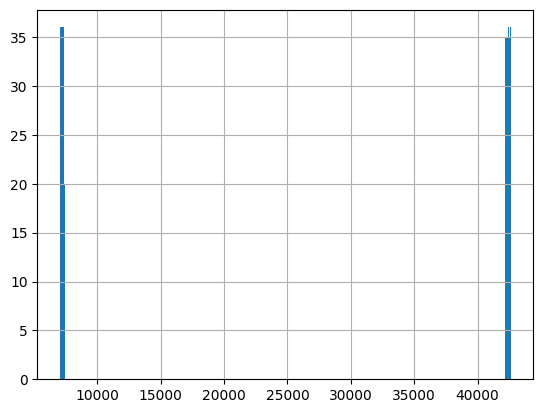

In [15]:
df2 = pd.DataFrame({"data":sorted(df['Sender Port_y'].unique())})
hist = df2['data'].hist(bins=1000)
fig = hist.get_figure()
# fig.set_xlabel("Port Number")
# fig.set_ylabel("Frequency")
# fig.set_title("Histogram of Port Number Frequency on Odido NL")
fig.savefig("figures/mycall_hist_10_bins.png")
fig.show()

In [12]:
unique = df['Sender Port_y'].sort_values().unique()
print(unique)

[ 7048  7049  7050  7051  7052  7053  7054  7055  7056  7057  7058  7059
  7060  7061  7062  7063  7064  7065  7066  7067  7068  7069  7070  7071
  7072  7073  7074  7075  7076  7077  7078  7079  7080  7081  7082  7083
  7084  7085  7086  7087  7088  7089  7090  7091  7092  7093  7094  7095
  7096  7097  7098  7099  7100  7101  7102  7103  7104  7105  7106  7107
  7108  7109  7110  7111  7112  7113  7114  7115  7116  7117  7118  7119
  7120  7121  7122  7123  7124  7125  7126  7127  7128  7129  7130  7131
  7132  7133  7134  7135  7136  7137  7138  7139  7140  7141  7142  7143
  7144  7145  7146  7147  7148  7149  7150  7151  7152  7153  7154  7155
  7156  7157  7158  7159  7160  7161  7162  7163  7164  7165  7166  7167
  7168  7169  7170  7171  7172  7173  7174  7175  7176  7177  7178  7179
  7180  7181  7182  7183  7184  7185  7186  7187  7188  7189  7190  7191
  7192  7193  7194  7195  7196  7197  7198  7199  7200  7201  7202  7203
  7204  7205  7206  7207  7208  7209  7210  7211  7

# [7048,7419], [42188,42623]

In [13]:
firstList = list(range(7048,7420))
secondList = list(range(42188,42624))

for x in unique: 
    if x not in firstList and x not in secondList:
        print(x)

7420
7421
7422
7423


Only four numbers missing in the whole range 
Very big reusability 
Figure out how often a port is reused  